SREENIVASAN S

mail: sreenivasan.2021@vitstudent.ac.in

Ph: 8590942343

## Checking GPU

In [ ]:
!nvidia-smi

Wed Sep 25 08:11:22 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.94                 Driver Version: 560.94         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1060      WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   42C    P8              3W /   20W |       0MiB /   6144MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Importing Libs

In [ ]:
# !pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.94  Python-3.10.0 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
Setup complete  (4 CPUs, 15.9 GB RAM, 151.7/931.5 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

## Downloading Dataset

In [ ]:
!gdown 1nnFHP_Pps_d71DI7KbQ4Pfx0239K_dUv

Downloading...
From (original): https://drive.google.com/uc?id=1nnFHP_Pps_d71DI7KbQ4Pfx0239K_dUv
From (redirected): https://drive.google.com/uc?id=1nnFHP_Pps_d71DI7KbQ4Pfx0239K_dUv&confirm=t&uuid=5125851e-2388-4245-a2a8-305b645bacac
To: d:\Viren\Qriocity\Bird\HV-AI-2024.zip

  0%|          | 0.00/1.14G [00:00<?, ?B/s]
  0%|          | 524k/1.14G [00:00<13:01, 1.46MB/s]
  0%|          | 1.05M/1.14G [00:00<09:32, 1.99MB/s]
  0%|          | 1.57M/1.14G [00:00<07:10, 2.64MB/s]
  0%|          | 2.10M/1.14G [00:00<06:03, 3.12MB/s]
  0%|          | 2.62M/1.14G [00:00<05:20, 3.55MB/s]
  0%|          | 3.15M/1.14G [00:01<05:12, 3.63MB/s]
  0%|          | 3.67M/1.14G [00:01<05:20, 3.55MB/s]
  0%|          | 4.19M/1.14G [00:01<04:52, 3.87MB/s]
  0%|          | 4.72M/1.14G [00:01<04:53, 3.86MB/s]
  0%|          | 5.24M/1.14G [00:01<04:42, 4.02MB/s]
  1%|          | 5.77M/1.14G [00:01<05:28, 3.46MB/s]
  1%|          | 6.29M/1.14G [00:01<05:44, 3.29MB/s]
  1%|          | 6.82M/1.14G [00:02<05:30, 3.

## Plotting Training and Test Images

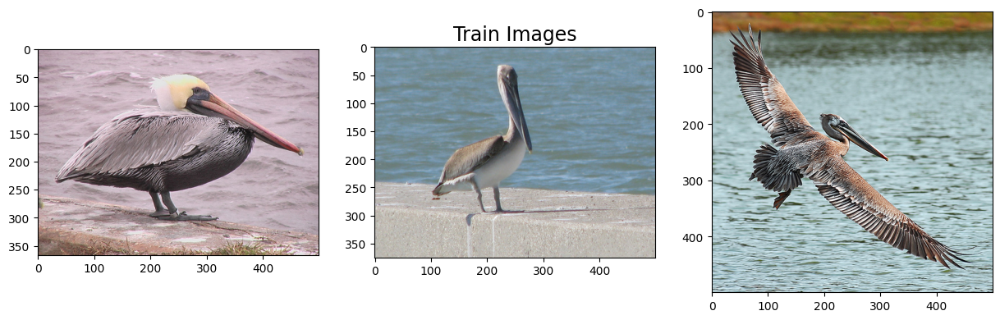

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from glob import glob


train_images = glob('HV-AI-2024/HV-AI-2024/images/train/*.jpg')[0:3]
test_images = glob('HV-AI-2024/HV-AI-2024/images/test/*.jpg')[0:3]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, image in enumerate(train_images):
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)

axes[1].set_title('Train Images',fontsize=17)
plt.show()

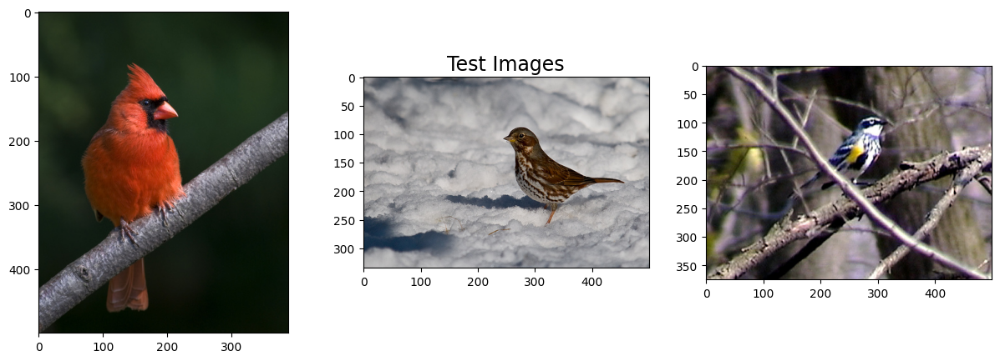

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, image in enumerate(test_images):
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)

axes[1].set_title('Test Images',fontsize=17)
plt.show()

## Splitting the Dataset and Converting it into Yolo format (Folder Structure)

In [ ]:
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your train.csv file
df = pd.read_csv('HV-AI-2024\\HV-AI-2024\\train.csv')

# Define the base directory where your images are stored
base_image_dir = 'HV-AI-2024\\HV-AI-2024'  # Update with your actual directory

# Define where to save the organized dataset
train_dir = 'dataset\\train'
val_dir = 'dataset\\val'

# Create the target folder structure
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Split the dataset into training and validation (e.g., 80% train, 20% val)
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['class'], random_state=42)

# Function to organize images into class-based folders
def organize_images(df, target_dir):
    for index, row in df.iterrows():
        image_path = os.path.join(base_image_dir, row['path'])
        class_id = row['class']
        print(image_path)
        # Create a subfolder for each class
        class_folder = os.path.join(target_dir, str(class_id))
        os.makedirs(class_folder, exist_ok=True)

        # Move the image to the corresponding class folder
        shutil.copy(image_path, class_folder)

# Organize training images
organize_images(train_df, train_dir)

# Organize validation images
organize_images(val_df, val_dir)

print("Dataset restructuring for train and validation sets complete!")


HV-AI-2024\HV-AI-2024\images/train/62_3574.jpg
HV-AI-2024\HV-AI-2024\images/train/88_5129.jpg
HV-AI-2024\HV-AI-2024\images/train/105_6096.jpg
HV-AI-2024\HV-AI-2024\images/train/8_393.jpg
HV-AI-2024\HV-AI-2024\images/train/2_96.jpg
HV-AI-2024\HV-AI-2024\images/train/35_1957.jpg
HV-AI-2024\HV-AI-2024\images/train/146_8567.jpg
HV-AI-2024\HV-AI-2024\images/train/67_3888.jpg
HV-AI-2024\HV-AI-2024\images/train/110_6423.jpg
HV-AI-2024\HV-AI-2024\images/train/103_6018.jpg
HV-AI-2024\HV-AI-2024\images/train/64_3693.jpg
HV-AI-2024\HV-AI-2024\images/train/5_267.jpg
HV-AI-2024\HV-AI-2024\images/train/117_6848.jpg
HV-AI-2024\HV-AI-2024\images/train/113_6600.jpg
HV-AI-2024\HV-AI-2024\images/train/158_9235.jpg
HV-AI-2024\HV-AI-2024\images/train/57_3289.jpg
HV-AI-2024\HV-AI-2024\images/train/2_115.jpg
HV-AI-2024\HV-AI-2024\images/train/5_269.jpg
HV-AI-2024\HV-AI-2024\images/train/106_6177.jpg
HV-AI-2024\HV-AI-2024\images/train/200_11781.jpg
HV-AI-2024\HV-AI-2024\images/train/96_5579.jpg
HV-AI-2024\HV-

## Argumenting the Images

In [ ]:
import os
import cv2
import imgaug.augmenters as iaa
import numpy as np

# Directory containing class folders
main_folder = 'dataset\\train'

# Define the augmentation pipeline using imgaug
aug = iaa.Sequential([
    iaa.Fliplr(0.5),          # 50% chance to horizontally flip
    iaa.Flipud(0.2),          # 20% chance to vertically flip
    iaa.Affine(rotate=(-20, 20)), # Random rotation between -20 and 20 degrees
    iaa.Multiply((0.8, 1.2)), # Random brightness adjustment (80% to 120%)
    iaa.GaussianBlur(sigma=(0.0, 1.0)) # Apply Gaussian blur with random sigma
])

# Define the number of augmentations per image
num_augmentations = 3

# Loop through each folder (class) in the main folder
for class_folder in os.listdir(main_folder):
    class_path = os.path.join(main_folder, class_folder)

    # Check if it's a directory (skip non-folder items)
    if os.path.isdir(class_path):
        # Loop through each image in the folder
        for img_file in os.listdir(class_path):
            if img_file.endswith(('.jpg', '.png', '.jpeg')):
                img_path = os.path.join(class_path, img_file)

                # Load the image using OpenCV
                image = cv2.imread(img_path)

                # Convert from BGR to RGB (imgaug uses RGB format)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Generate augmentations
                for i in range(num_augmentations):
                    # Apply augmentation
                    augmented_image = aug(image=image)

                    # Convert back from RGB to BGR for saving
                    augmented_image = cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR)

                    # Save the augmented image
                    aug_img_name = f"{os.path.splitext(img_file)[0]}_aug_{i}.jpg"
                    aug_img_path = os.path.join(class_path, aug_img_name)
                    cv2.imwrite(aug_img_path, augmented_image)

print(f"Image augmentation completed. Augmented images saved in {main_folder}.")


Image augmentation completed. Augmented images saved in dataset\train.


## Checking the Number of images in Each Folder
> Prev it was 24, After Argumentation, Images increased to 96

Class Counts:
0: 96
1: 96
10: 96
100: 96
101: 96
102: 96
103: 96
104: 96
105: 96
106: 92
107: 96
108: 96
109: 96
11: 96
110: 96
111: 96
112: 96
113: 96
114: 96
115: 96
116: 96
117: 96
118: 96
119: 96
12: 96
120: 96
121: 96
122: 96
123: 96
124: 96
125: 92
126: 96
127: 96
128: 96
129: 96
13: 96
130: 96
131: 96
132: 96
133: 96
134: 92
135: 96
136: 96
137: 96
138: 96
139: 96
14: 96
140: 92
141: 96
142: 96
143: 96
144: 96
145: 96
146: 96
147: 96
148: 96
149: 96
15: 96
150: 96
151: 96
152: 96
153: 96
154: 96
155: 96
156: 96
157: 96
158: 96
159: 96
16: 96
160: 96
161: 96
162: 96
163: 96
164: 96
165: 96
166: 96
167: 96
168: 96
169: 96
17: 96
170: 96
171: 96
172: 96
173: 96
174: 96
175: 96
176: 96
177: 96
178: 96
179: 96
18: 96
180: 96
181: 96
182: 96
183: 96
184: 96
185: 96
186: 96
187: 96
188: 96
189: 92
19: 96
190: 96
191: 96
192: 96
193: 96
194: 96
195: 96
196: 96
197: 96
198: 96
199: 96
2: 96
20: 96
21: 96
22: 96
23: 96
24: 96
25: 96
26: 96
27: 96
28: 96
29: 96
3: 96
30: 96
31: 96
32: 96
3

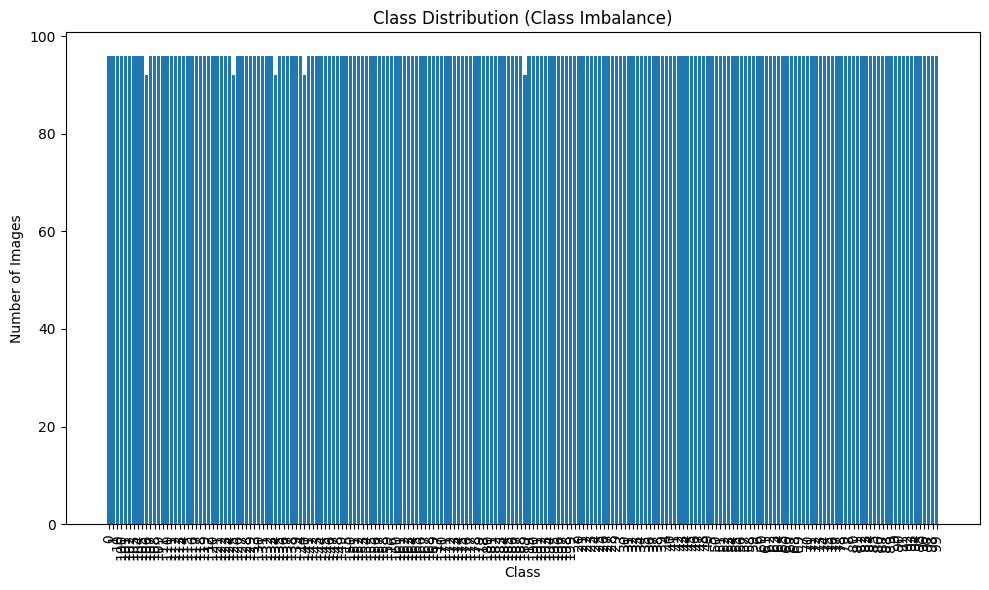

In [ ]:
import os
import matplotlib.pyplot as plt

# Directory containing class folders
main_folder = 'dataset\\train'

# Dictionary to hold class (folder name) and number of images
class_counts = {}

# Loop through each folder (class) in the main folder
for class_folder in os.listdir(main_folder):
    class_path = os.path.join(main_folder, class_folder)

    # Check if it's a directory (skip non-folder items)
    if os.path.isdir(class_path):
        # Count the number of images in the folder
        num_images = len([img for img in os.listdir(class_path) if img.endswith(('.jpg', '.png', '.jpeg'))])

        # Store the class name and the number of images
        class_counts[class_folder] = num_images

# Print the class counts
print("Class Counts:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")

# Plotting the class imbalance
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Class Distribution (Class Imbalance)')
plt.xticks(rotation=90)  # Rotate class labels for better visibility
plt.tight_layout()
plt.show()


## Training the Model
> Model Parameters
> Epochs = 200
> Image size = 64 x 64
> Batch = 64

In [ ]:
!yolo task=classify mode=train model=yolov8n-cls.pt data="dataset" epochs=200 imgsz=64 batch=64 device=0

New https://pypi.org/project/ultralytics/8.2.100 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.94 🚀 Python-3.10.0 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
engine\trainer: task=classify, mode=train, model=yolov8n-cls.pt, data=dataset, epochs=200, time=None, patience=100, batch=64, imgsz=64, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_fra


train: Scanning D:\Viren\Qriocity\Bird\dataset\train... 19180 images, 0 corrupt: 100%|██████████| 19180/19180 [00:00<?, ?it/s]
train: Scanning D:\Viren\Qriocity\Bird\dataset\train... 19180 images, 0 corrupt: 100%|██████████| 19180/19180 [00:00<?, ?it/s]

val: Scanning D:\Viren\Qriocity\Bird\dataset\val... 1199 images, 0 corrupt: 100%|██████████| 1199/1199 [00:00<?, ?it/s]
val: Scanning D:\Viren\Qriocity\Bird\dataset\val... 1199 images, 0 corrupt: 100%|██████████| 1199/1199 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]
      1/200     0.182G      5.507         64         64:   0%|          | 0/300 [00:00<?, ?it/s]
      1/200     0.182G      5.507         64         64:   0%|          | 1/300 [00:00<02:52,  1.74it/s]
      1/200     0.187G      5.541         64         64:   0%|          | 1/300 [00:00<02:52,  1.74it/s]
      1/200     0.187G      5.541         64         64:   1%|          | 2/300 [00:00<01:31,  3.24it/s]
      1/200     0.187G       5.57         64       


     40/200     0.187G     0.6375         64         64:  95%|█████████▌| 285/300 [00:36<00:01,  8.06it/s]
     40/200     0.187G     0.6375         64         64:  96%|█████████▌| 287/300 [00:36<00:01,  7.18it/s]
     40/200     0.187G     0.6369         64         64:  96%|█████████▌| 287/300 [00:36<00:01,  7.18it/s]
     40/200     0.187G     0.6369         64         64:  96%|█████████▌| 288/300 [00:36<00:01,  7.39it/s]
     40/200     0.187G     0.6369         64         64:  96%|█████████▌| 288/300 [00:36<00:01,  7.39it/s]
     40/200     0.187G     0.6369         64         64:  96%|█████████▋| 289/300 [00:36<00:01,  7.23it/s]
     40/200     0.187G     0.6376         64         64:  96%|█████████▋| 289/300 [00:36<00:01,  7.23it/s]
     40/200     0.187G     0.6371         64         64:  96%|█████████▋| 289/300 [00:37<00:01,  7.23it/s]
     40/200     0.187G     0.6371         64         64:  97%|█████████▋| 291/300 [00:37<00:01,  6.87it/s]
     40/200     0.187G     0.6363   

## Model Validation

In [ ]:
!yolo task=classify mode=val model="runs\\classify\\train3\\weights\\best.pt" data="dataset"

Ultralytics YOLOv8.2.94 🚀 Python-3.10.0 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
YOLOv8n-cls summary (fused): 73 layers, 1,691,080 parameters, 0 gradients, 3.5 GFLOPs
train: D:\Viren\Qriocity\Bird\dataset\train... found 19180 images in 200 classes ✅ 
val: D:\Viren\Qriocity\Bird\dataset\val... found 1199 images in 200 classes ✅ 
test: None...
                   all      0.256      0.523
Speed: 0.0ms preprocess, 0.9ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs\classify\val
💡 Learn more at https://docs.ultralytics.com/modes/val



val: Scanning D:\Viren\Qriocity\Bird\dataset\val... 1199 images, 0 corrupt: 100%|██████████| 1199/1199 [00:00<?, ?it/s]
val: Scanning D:\Viren\Qriocity\Bird\dataset\val... 1199 images, 0 corrupt: 100%|██████████| 1199/1199 [00:00<?, ?it/s]

               classes   top1_acc   top5_acc: 100%|██████████| 75/75 [00:03<00:00, 24.52it/s]


## Inferencing and Saving the Classes and Confidence in csv file

In [ ]:
import os
import csv
from ultralytics import YOLO

# Initialize the YOLO model
model = YOLO('bestff.pt')

# Directory containing test images
source_dir = 'HV-AI-2024\\HV-AI-2024\\images\\test'

# Create a list to store results
results_list = []

# Loop through all images in the test folder
for filename in os.listdir(source_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):  # Check for image files
        image_path = os.path.join(source_dir, filename)

        # Run prediction on the image
        results = model.predict(source=image_path, save=False)

        # Extract prediction details
        for result in results:
            probs = result.probs
            class_index = probs.top1  # Top class index
            class_name = result.names[class_index]  # Class name
            score = round(float(probs.top1conf.cpu().numpy()), 2)  # Confidence score rounded to 2 decimal places

            # Convert absolute path to relative path
            relative_path = f"images/test/{filename}"

            # Store relative path, predicted label, and confidence score in the results list
            results_list.append([relative_path, class_name, score])

# Define CSV file path
csv_file_path = 'prediction.csv'

# Write results to CSV file
with open(csv_file_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    # Write the header
    writer.writerow(["path", "predicted_label", "confidence_score"])
    # Write the data rows
    writer.writerows(results_list)

print(f"Results saved to {csv_file_path}")



image 1/1 d:\Viren\Qriocity\Bird\HV-AI-2024\HV-AI-2024\images\test\test_1.jpg: 64x64 41 0.65, 16 0.33, 139 0.00, 94 0.00, 68 0.00, 11.0ms
Speed: 8.0ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 d:\Viren\Qriocity\Bird\HV-AI-2024\HV-AI-2024\images\test\test_10.jpg: 64x64 103 0.50, 128 0.22, 130 0.15, 115 0.05, 148 0.01, 15.5ms
Speed: 5.0ms preprocess, 15.5ms inference, 1.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 d:\Viren\Qriocity\Bird\HV-AI-2024\HV-AI-2024\images\test\test_100.jpg: 64x64 79 0.75, 78 0.16, 81 0.01, 173 0.01, 165 0.01, 12.5ms
Speed: 6.6ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 d:\Viren\Qriocity\Bird\HV-AI-2024\HV-AI-2024\images\test\test_1000.jpg: 64x64 61 0.84, 176 0.04, 79 0.02, 72 0.01, 131 0.01, 16.0ms
Speed: 8.5ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 d:\Viren\Qriocity\Bird\HV-AI-2024\HV-AI-2

In [1]:
import requests

def send_results_for_evaluation(name, csv_file, email):
    url = "http://43.205.49.236:5050/inference"
    files = {'file': open(csv_file, 'rb')}
    data = {'email': email, 'name':name}
    response = requests.post(url, files=files, data=data)
    return response.json()



In [2]:

print('Accuracy: ')
print(send_results_for_evaluation('sreenivasan', 'prediction.csv', 'sreenivasan.2021@vitstudent.ac.in'))

Accuracy: 
{'overall_accuracy (%)': 35.91647, 'max_accuracy_class': 11, 'max_accuracy (%)': 88.46154, 'min_accuracy_class': 178, 'min_accuracy (%)': 0.0}
